In [1]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import hvplot.pandas


crime_file22 = os.path.join("AD_Resources", "AD_Crime_Reports_2022-2.csv")
crime_df22 = pd.read_csv(crime_file22, low_memory=False, encoding="Latin-1")

crime_file21 = os.path.join("AD_Resources", "AD_Crime_Reports_2021.csv")
crime_df21 = pd.read_csv(crime_file21, low_memory=False, encoding="Latin-1")

crime_file19 = os.path.join("AD_Resources", "AD_Crime_Reports_2019.csv")
crime_df19 = pd.read_csv(crime_file19, low_memory=False, encoding="Latin-1")


# To view the headers, you can use the columns attribute of the DataFrame
headers22 = crime_df22.columns
headers21 = crime_df21.columns
headers19 = crime_df19.columns


print(headers22)
print(headers21)
print(headers19)



Index(['Incident Number', 'Highest Offense Description',
       'Highest Offense Code', 'Family Violence', 'Occurred Date Time',
       'Occurred Date', 'Occurred Time', 'Report Date Time', 'Report Date',
       'Report Time', 'Location Type', 'Address', 'Zip Code',
       'Council District', 'APD Sector', 'APD District', 'PRA', 'Census Tract',
       'Clearance Status', 'Clearance Date', 'UCR Category',
       'Category Description', 'X-coordinate', 'Y-coordinate', 'Latitude',
       'Longitude', 'Location'],
      dtype='object')
Index(['Incident Number', 'Highest Offense Description',
       'Highest Offense Code', 'Family Violence', 'Occurred Date Time',
       'Occurred Date', 'Occurred Time', 'Report Date Time', 'Report Date',
       'Report Time', 'Location Type', 'Address', 'Zip Code',
       'Council District', 'APD Sector', 'APD District', 'PRA', 'Census Tract',
       'Clearance Status', 'Clearance Date', 'UCR Category',
       'Category Description', 'X-coordinate', 'Y-coor

In [2]:
# unique_zipcodes20 = pd.DataFrame({'Zip Codes':crime_df20['Zip Code'].unique()})
# unique_zipcodes21 = pd.DataFrame({'Zip Codes':crime_df21['Zip Code'].unique()})
# unique_zipcodes22 = pd.DataFrame({'Zip Codes':crime_df22['Zip Code'].unique()})

# unique_zipcodes20.dropna(inplace=True)
# unique_zipcodes21.dropna(inplace=True)
# unique_zipcodes22.dropna(inplace=True)

# unique_zipcodes20['Zip Codes'] = unique_zipcodes20['Zip Codes'].astype(int)
# unique_zipcodes21['Zip Codes'] = unique_zipcodes21['Zip Codes'].astype(int)
# unique_zipcodes22['Zip Codes'] = unique_zipcodes22['Zip Codes'].astype(int)


# print(unique_zipcodes20)
# print(unique_zipcodes21)
# print(unique_zipcodes22)


In [3]:
# Convert the "Date" column to datetime data type
crime_df19['Occurred Date Time'] = pd.to_datetime(crime_df19['Occurred Date Time'])
crime_df21['Occurred Date Time'] = pd.to_datetime(crime_df21['Occurred Date Time'])
crime_df22['Occurred Date Time'] = pd.to_datetime(crime_df22['Occurred Date Time'])


# Filter the data to only include records from the year 2020-2022
crime_df19 = crime_df19[crime_df19['Occurred Date Time'].dt.year == 2019]
crime_df21 = crime_df21[crime_df21['Occurred Date Time'].dt.year == 2021]
crime_df22 = crime_df22[crime_df22['Occurred Date Time'].dt.year == 2022]


# Extract the month from the "Occurred Date" column and create a new column 'Month'
crime_df19['Month'] = crime_df19['Occurred Date Time'].dt.month
crime_df19['Year'] = crime_df19['Occurred Date Time'].dt.year

crime_df21['Month'] = crime_df21['Occurred Date Time'].dt.month
crime_df21['Year'] = crime_df21['Occurred Date Time'].dt.year

crime_df22['Month'] = crime_df22['Occurred Date Time'].dt.month
crime_df22['Year'] = crime_df22['Occurred Date Time'].dt.year


# Group the data by "Zip Code" and calculate the average number of crimes per month in 2020-2022
crimes_by_zip_month_19 = crime_df19.groupby(['Year', 'Month']).size().reset_index(name='No. of Crimes')
crimes_by_zip_month_21 = crime_df21.groupby(['Year', 'Month']).size().reset_index(name='No. of Crimes')
crimes_by_zip_month_22 = crime_df22.groupby(['Year', 'Month']).size().reset_index(name='No. of Crimes')

crimes_by_zip_month_19.dropna(inplace=True)
crimes_by_zip_month_21.dropna(inplace=True)
crimes_by_zip_month_22.dropna(inplace=True)

#crimes_by_zip_month_20['Zip Code'] = crimes_by_zip_month_20['Zip Code'].astype(int)
crimes_by_zip_month_19['No. of Crimes'] = crimes_by_zip_month_19['No. of Crimes'].astype(int)

#crimes_by_zip_month_21['Zip Code'] = crimes_by_zip_month_21['Zip Code'].astype(int)
crimes_by_zip_month_21['No. of Crimes'] = crimes_by_zip_month_21['No. of Crimes'].astype(int)

#crimes_by_zip_month_22['Zip Code'] = crimes_by_zip_month_22['Zip Code'].astype(int)
crimes_by_zip_month_22['No. of Crimes'] = crimes_by_zip_month_22['No. of Crimes'].astype(int)

crime_df19

,Incident Number,Highest Offense Description,Highest Offense Code,Family Violence,Occurred Date Time,Occurred Date,Occurred Time,Report Date Time,Report Date,Report Time,...,Clearance Date,UCR Category,Category Description,X-coordinate,Y-coordinate,Latitude,Longitude,Location,Month,Year
1,2.019206e+08,ASSAULT CONTACT-SEXUAL NATURE,902,N,2019-01-02 12:03:00,1/2/19,1203,1/2/19 12:03,1/2/19,1203,...,1/3/19,NaN,NaN,0.0,0.0,NaN,NaN,NaN,1,2019
2,2.019500e+10,FAILURE TO REG AS SEX OFFENDER,1799,N,2019-01-02 16:23:00,1/2/19,1623,1/2/19 16:23,1/2/19,1623,...,2/6/19,NaN,NaN,0.0,0.0,NaN,NaN,NaN,1,2019
4,2.019500e+10,SEXUAL ASSAULT OF CHILD/OBJECT,1707,N,2019-01-02 10:03:00,1/2/19,1003,1/2/19 10:03,1/2/19,1003,...,3/29/19,11C,Rape,0.0,0.0,NaN,NaN,NaN,1,2019
7,2.019210e+08,FAMILY DISTURBANCE,3400,N,2019-01-02 16:12:00,1/2/19,1612,1/2/19 16:12,1/2/19,1612,...,1/15/19,NaN,NaN,0.0,0.0,NaN,NaN,NaN,1,2019
8,2.019214e+08,RAPE,200,N,2019-01-02 20:27:00,1/2/19,2027,1/2/19 20:45,1/2/19,2045,...,1/5/19,11A,Rape,0.0,0.0,NaN,NaN,NaN,1,2019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102874,2.019505e+10,BURGLARY OF VEHICLE,601,N,2019-11-30 17:00:00,11/30/19,1700,12/31/19 10:06,12/31/19,1006,...,1/1/20,23F,Theft,3120984.0,10118427.0,30.398684,-97.718131,POINT (-97.71813109 30.39868407),11,2019
102875,2.019505e+10,BURGLARY OF VEHICLE,601,N,2019-12-26 12:00:00,12/26/19,1200,12/31/19 10:57,12/31/19,1057,...,1/6/20,23F,Theft,3107646.0,10069258.0,30.264380,-97.764029,POINT (-97.76402921 30.26438022),12,2019
102876,2.019505e+10,THEFT,600,N,2019-12-30 19:30:00,12/30/19,1930,12/31/19 9:28,12/31/19,928,...,12/31/19,23H,Theft,3094135.0,10066586.0,30.257886,-97.807007,POINT (-97.80700704 30.25788603),12,2019
102877,2.019365e+10,THEFT,600,N,2019-12-31 11:21:00,12/31/19,1121,12/31/19 13:44,12/31/19,1344,...,1/2/20,23H,Theft,3125498.0,10078605.0,30.288927,-97.706799,POINT (-97.70679901 30.28892741),12,2019


In [4]:
combined_data = pd.concat([crimes_by_zip_month_19, crimes_by_zip_month_21, crimes_by_zip_month_22])


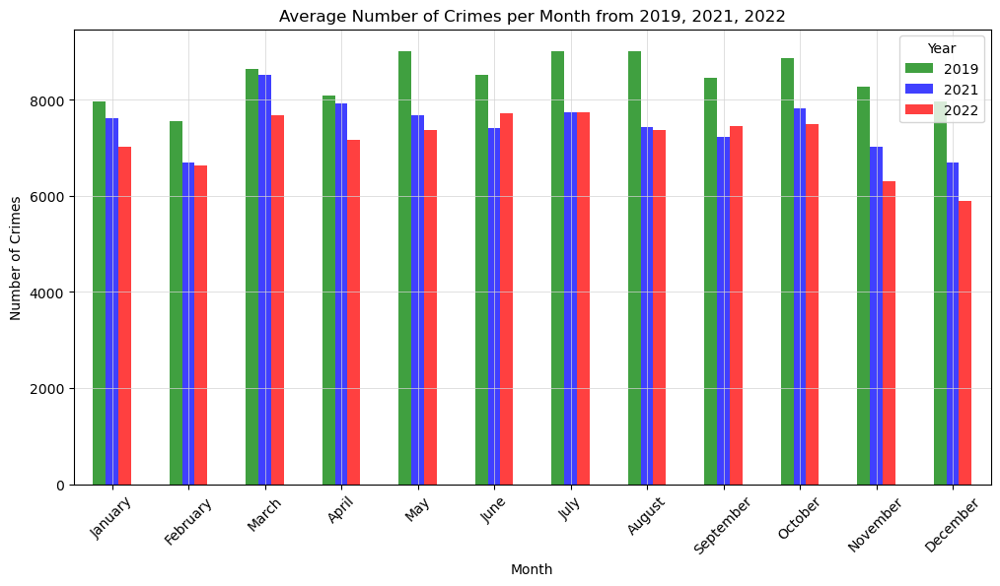

In [5]:
pivot_table = combined_data.pivot_table(index=['Month'], columns='Year', values='No. of Crimes',fill_value=0.5)

month_names = {1: 'January', 2: 'February', 3: 'March', 4: 'April',
               5: 'May', 6: 'June', 7: 'July', 8: 'August',
               9: 'September', 10: 'October', 11: 'November', 12: 'December'}

pivot_table.index = pivot_table.index.map(month_names)

# Plot the bar graph using pandas.plot with grouped bars for each year and different colors
ax = pivot_table.plot(kind='bar', figsize=(12, 6), color=['green', 'blue', 'red'],alpha=.75)

plt.xlabel('Month')
plt.ylabel('Number of Crimes')
plt.title('Average Number of Crimes per Month from 2019, 2021, 2022')
plt.xticks(rotation=45)
plt.legend(title='Year', labels=['2019', '2021', '2022'])

# Set x and y-axis labels
ax.set_xlabel('Month')
ax.set_ylabel('Number of Crimes')
plt.grid(color="lightgray",linestyle="-",linewidth=.5)

plt.show()

In [6]:
crime_codes = {601: 'BURGLARY OF VEHICLE/NON RESIDENCE', 3400: 'FAMILY DISTURBANCE', 600: 'THEFT', 1400: 'CRIMINAL MISCHIEF',
               900: 'ASSAULT W/INJURY-FAM/DATE VIOL', 700: 'AUTO THEFT', 2703: 'HARASSMENT', 902: 'ASSAULT BY CONTACT FAM/DATING/SEXUAL',
               607: 'THEFT BY SHOPLIFTING', 3401: 'DISTURBANCE - OTHER',4022:'AGG ASSAULT FAM/DATE VIOLENCE',502:'BURGLARY NON RESIDENCE',
               620:'THEFT CATALYTIC CONVERTER',2716:'CRIMINAL TRESPASS'}

# Replace numeric offense codes with offense descriptions
crime_df19['Highest Offense Description'] = crime_df19['Highest Offense Code'].replace(crime_codes)
crime_df21['Highest Offense Description'] = crime_df21['Highest Offense Code'].replace(crime_codes)
crime_df22['Highest Offense Description'] = crime_df22['Highest Offense Code'].replace(crime_codes)


# Get the top 10 "Highest Offense Description"
top10_19 = crime_df19['Highest Offense Description'].value_counts().head(5).reset_index()
top10_21 = crime_df21['Highest Offense Description'].value_counts().head(5).reset_index()
top10_22 = crime_df22['Highest Offense Description'].value_counts().head(5).reset_index()

# Rename the columns for each year's top 10 DataFrame
top10_19.columns = ['Highest Offense Description', 'Count']
top10_21.columns = ['Highest Offense Description', 'Count']
top10_22.columns = ['Highest Offense Description', 'Count']

# Add "Year" column to each year's top 10 DataFrame
top10_19['Year'] = 2019
top10_21['Year'] = 2021
top10_22['Year'] = 2022

# Concatenate the DataFrames to include "Year" information
combined_top10 = pd.concat([top10_19, top10_21, top10_22])

print(combined_top10)





         Highest Offense Description  Count  Year
0  BURGLARY OF VEHICLE/NON RESIDENCE  11695  2019
1                 FAMILY DISTURBANCE  10359  2019
2                              THEFT   9395  2019
3     ASSAULT W/INJURY-FAM/DATE VIOL   6103  2019
4                  CRIMINAL MISCHIEF   5494  2019
0                 FAMILY DISTURBANCE   9643  2021
1  BURGLARY OF VEHICLE/NON RESIDENCE   9073  2021
2                              THEFT   5988  2021
3     ASSAULT W/INJURY-FAM/DATE VIOL   5726  2021
4                  CRIMINAL MISCHIEF   5066  2021
0  BURGLARY OF VEHICLE/NON RESIDENCE   9712  2022
1                 FAMILY DISTURBANCE   8464  2022
2     ASSAULT W/INJURY-FAM/DATE VIOL   5500  2022
3                              THEFT   5271  2022
4                         AUTO THEFT   5028  2022


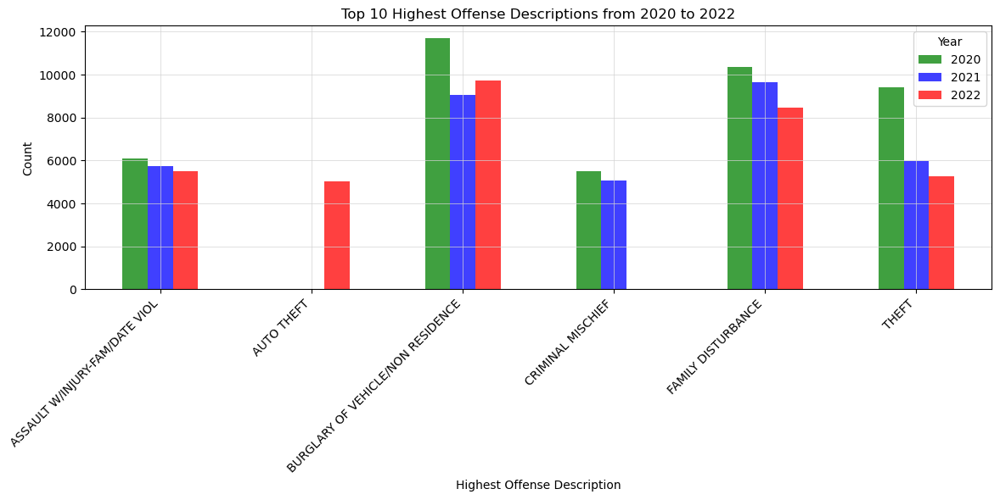

In [7]:

pivot_table = combined_top10.pivot_table(index=['Highest Offense Description'], columns='Year', values='Count',fill_value=0.5)


# Plot the bar graph using pandas.plot with grouped bars for each year and different colors
ax = pivot_table.plot(kind='bar', figsize=(12, 6), color=['green', 'blue', 'red'],alpha=.75)



plt.xlabel('Highest Offense Description')
plt.ylabel('Count')
plt.title('Top 10 Highest Offense Descriptions from 2020 to 2022')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Year', labels=['2020', '2021', '2022'])

# Set x and y-axis labels
ax.set_xlabel('Highest Offense Description')
ax.set_ylabel('Count')
plt.grid(color="lightgray",linestyle="-",linewidth=.5)

plt.tight_layout()
plt.show()


In [8]:
top_10_offenses = combined_top10['Highest Offense Description'].tolist()

# Filter the original DataFrame for each year using the top 10 offense descriptions
top_10_crimes_19 = crime_df19[crime_df19['Highest Offense Description'].isin(top_10_offenses)][['Highest Offense Description','Year','Zip Code','Address','Latitude', 'Longitude']]
top_10_crimes_21 = crime_df21[crime_df21['Highest Offense Description'].isin(top_10_offenses)][['Highest Offense Description','Year','Zip Code','Address', 'Latitude', 'Longitude']]
top_10_crimes_22 = crime_df22[crime_df22['Highest Offense Description'].isin(top_10_offenses)][['Highest Offense Description', 'Year','Zip Code','Address','Latitude', 'Longitude']]

top_10_crimes_19.dropna(inplace=True)
top_10_crimes_19['Zip Code'] = top_10_crimes_19['Zip Code'].astype(int)

top_10_crimes_21.dropna(inplace=True)
top_10_crimes_21['Zip Code'] = top_10_crimes_21['Zip Code'].astype(int)

top_10_crimes_22.dropna(inplace=True)
top_10_crimes_22['Zip Code'] = top_10_crimes_22['Zip Code'].astype(int)

# Concatenate the DataFrames for all years
all_top_10_crimes = pd.concat([top_10_crimes_19, top_10_crimes_21, top_10_crimes_22])


top_10_crimes_19

,Highest Offense Description,Year,Zip Code,Address,Latitude,Longitude
10,CRIMINAL MISCHIEF,2019,78704,515 S CONGRESS AVE,30.256089,-97.747009
12,THEFT,2019,78745,1405 W WILLIAM CANNON DR,30.200149,-97.799351
15,FAMILY DISTURBANCE,2019,78745,6504 S 1ST ST,30.199081,-97.786938
17,FAMILY DISTURBANCE,2019,78758,9120 NORTHGATE BLVD,30.371486,-97.717178
28,BURGLARY OF VEHICLE/NON RESIDENCE,2019,78723,5900 THAMES DR,30.311482,-97.687343
...,...,...,...,...,...,...
102874,BURGLARY OF VEHICLE/NON RESIDENCE,2019,78758,2800 ESPERANZA XING,30.398684,-97.718131
102875,BURGLARY OF VEHICLE/NON RESIDENCE,2019,78704,1900 BARTON SPRINGS RD,30.264380,-97.764029
102876,THEFT,2019,78746,2901 S CAPITAL OF TEXAS HWY NB,30.257886,-97.807007
102877,THEFT,2019,78723,3839 AIRPORT BLVD,30.288927,-97.706799


In [9]:
offense_counts19 = top_10_crimes_19['Highest Offense Description'].value_counts()

# Divide the counts by 100
off_count100_20 = offense_counts19 / 100

# Create a DataFrame from the 'off_count100_20' Series
offense_counts_df = pd.DataFrame({'Highest Offense Description': off_count100_20.index,
                                  'Normalized Count': off_count100_20.values})



offense_counts_df


,Highest Offense Description,Normalized Count
0,BURGLARY OF VEHICLE/NON RESIDENCE,116.93
1,FAMILY DISTURBANCE,103.46
2,THEFT,93.78
3,ASSAULT W/INJURY-FAM/DATE VIOL,60.48
4,CRIMINAL MISCHIEF,54.90
5,AUTO THEFT,29.10


In [10]:
import hvplot.pandas
import holoviews as hv

map2019 = top_10_crimes_19.hvplot.points("Longitude",
                                         "Latitude",
                                         geo=True,
                                        color="Highest Offense Description",
                                        alpha=1,
                                        #size='Normalized Count',
                                        tiles="OSM",
                                    hover_cols=["Address"],
                                    frame_width=700,
                                    frame_height=700)

map2019


:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (Highest Offense Description,Address)

In [11]:
import hvplot.pandas
import holoviews as hv

map2021 = top_10_crimes_21.hvplot.points("Longitude",
                                         "Latitude",
                                         geo=True,
                                        color="Highest Offense Description",
                                        alpha=1,
                                        #size='Normalized Count',
                                        tiles="OSM",
                                    hover_cols=["Address"],
                                    frame_width=700,
                                    frame_height=700)

map2021

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (Highest Offense Description,Address)

In [12]:
import hvplot.pandas
import holoviews as hv

map2022 = top_10_crimes_22.hvplot.points("Longitude",
                                         "Latitude",
                                         geo=True,
                                        color="Highest Offense Description",
                                        alpha=1,
                                        #size='Normalized Count',
                                        tiles="OSM",
                                    hover_cols=["Address"],
                                    frame_width=700,
                                    frame_height=700)

map2022

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (Highest Offense Description,Address)

In [13]:
import plotly.figure_factory as ff

import pandas as pd

NE_states = ['Connecticut', 'Maine', 'Massachusetts', 'New Hampshire', 'Rhode Island', 'Vermont']
df_sample = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/minoritymajority.csv')
df_sample_r = df_sample[df_sample['STNAME'].isin(NE_states)]

values = df_sample_r['TOT_POP'].tolist()
fips = df_sample_r['FIPS'].tolist()

colorscale = [
    'rgb(68.0, 1.0, 84.0)',
    'rgb(66.0, 64.0, 134.0)',
    'rgb(38.0, 130.0, 142.0)',
    'rgb(63.0, 188.0, 115.0)',
    'rgb(216.0, 226.0, 25.0)'
]

fig = ff.create_choropleth(
    fips=fips, values=values,
    scope=NE_states, county_outline={'color': 'rgb(255,255,255)', 'width': 0.5},
    legend_title='Population per county'

)
fig.update_layout(
    legend_x = 0,
    annotations = {'x': -0.12, 'xanchor': 'left'}
)

fig.layout.template = None
fig.show()

ImportError: the 'read_file' function requires the 'fiona' package, but it is not installed or does not import correctly.
Importing fiona resulted in: No module named 'fiona'

In [ ]:
# # Convert the "Date" column to datetime data type
# crime_df['Occurred Date Time'] = pd.to_datetime(crime_df['Occurred Date Time'])


# # Filter the data to only include records from the year 2020-2022
#     # crime_df_2022 = crime_df[crime_df['Occurred Date Time'].dt.year == 2022]
#     # crime_df_2021 = crime_df[crime_df['Occurred Date Time'].dt.year == 2021]
#     # crime_df_2020 = crime_df[crime_df['Occurred Date Time'].dt.year == 2020]
# crime_df_2020_2021_2022 = crime_df[crime_df['Occurred Date Time'].dt.year.isin([2020, 2021, 2022])]


# # Extract the month from the "Occurred Date" column and create a new column 'Month'
#     # crime_df_2022['Month'] = crime_df_2022['Occurred Date Time'].dt.month
#     # crime_df_2022['Year'] = crime_df_2022['Occurred Date Time'].dt.year
# crime_df_2020_2021_2022['Month'] = crime_df_2020_2021_2022['Occurred Date Time'].dt.month
# crime_df_2020_2021_2022['Year'] = crime_df_2020_2021_2022['Occurred Date Time'].dt.year



# # Filter the data to include only January, February, and March (months 1, 2, and 3)
#     # crime_df_months20 = crime_df_2020[crime_df_2020['Occurred Date Time'].dt.month.isin(range(1, 13))]
#     # crime_df_months21 = crime_df_2021[crime_df_2021['Occurred Date Time'].dt.month.isin(range(1, 13))]
#     # crime_df_months22 = crime_df_2022[crime_df_2022['Occurred Date Time'].dt.month.isin(range(1, 13))]


    
# # Group the data by "Zip Code" and calculate the average number of crimes per month in 2022
#     # average_crimes_2020 = crime_df_months20.groupby(['Zip Code', crime_df_months20['Occurred Date Time'].dt.month]).size().reset_index(name='Average Crimes')
#     # average_crimes_2021 = crime_df_months21.groupby(['Zip Code', crime_df_months21['Occurred Date Time'].dt.month]).size().reset_index(name='Average Crimes')
#     # average_crimes_2022 = crime_df_months22.groupby(['Zip Code', crime_df_months22['Occurred Date Time'].dt.month]).size().reset_index(name='Average Crimes')
# average_crimes_by_zip_month_year = crime_df_2020_2021_2022.groupby(['Zip Code', 'Month', 'Year']).size().reset_index(name='Average Crimes')



#     # average_crimes_2020 = average_crimes_2020[average_crimes_2020['Average Crimes'] > 100]
#     # average_crimes_2021 = average_crimes_2020[average_crimes_2020['Average Crimes'] > 100]
#     # average_crimes_2022 = average_crimes_2020[average_crimes_2020['Average Crimes'] > 100]
# average_crimes_over_100 = average_crimes_by_zip_month_year[average_crimes_by_zip_month_year['Average Crimes'] > 100]

# average_crimes_over_100.dropna(inplace=True)

# average_crimes_over_100['Zip Code'] = average_crimes_over_100['Zip Code'].astype(int)
# average_crimes_over_100['Zip Code'] = average_crimes_over_100['Average Crimes'].astype(int)

# average_crimes_over_100
